<a href="https://colab.research.google.com/github/ibader85/UnstructuredDataAnalytics/blob/main/11_Advanced_Geospatial_Analysis_Updated.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

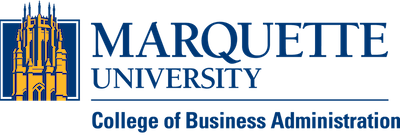

#BUAN4060: Unstructured Data Analytics

##11 Advanced Geospatial Analysis (Updated)

##Instructor: Dr. Badar Al Lawati "Dr. B"

**Acknowledgment:** This material is based on the content created by `Prof. Timothy E. Carone`

**R on Colab:**

* You can change the runtime from Python to R, by clicking on the down arrow next to Connect, and picking "Change Runtime Type"

* You can change the project name by clicking on the title on top of this page

* You can export your notebook by going to File > Download .ipynb



## 1. ggmap

**ggmap** is an R package that makes it easy to retrieve raster map tiles from popular online mapping services like Google Maps and Stamen Maps and plot them using the [ggplot2](https://github.com/tidyverse/ggplot2) framework:

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



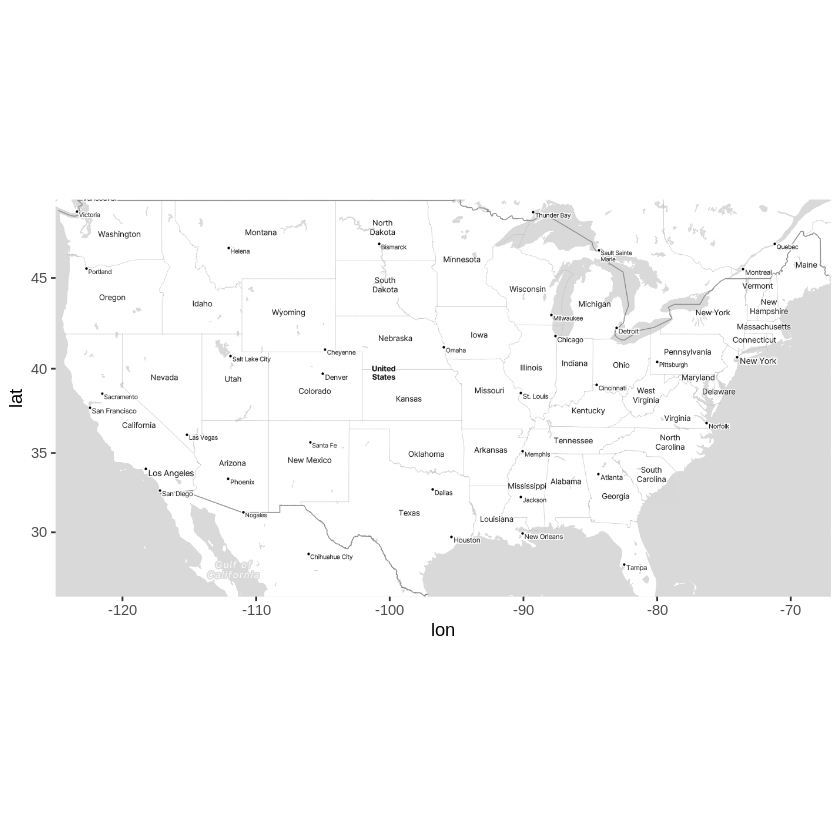

In [2]:
# Install and load ggmap package if not already installed
install.packages("ggmap")
library("ggmap")

# Register Stadia Maps API Key
register_stadiamaps(key = "Your API Key Here") # Replace with your actual Stadia Maps API key

# Define the bounding box for the US map
us <- c(left = -125, bottom = 25.75, right = -67, top = 49)

# Get the map using Stadia Maps with the correct maptype
get_stadiamap(us, zoom = 5, maptype = "stamen_toner_lite") %>% ggmap()

Use `qmplot()` in the same way you’d use `qplot()`, but with a map automatically added in the background:

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


ℹ Using `zoom = 14`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



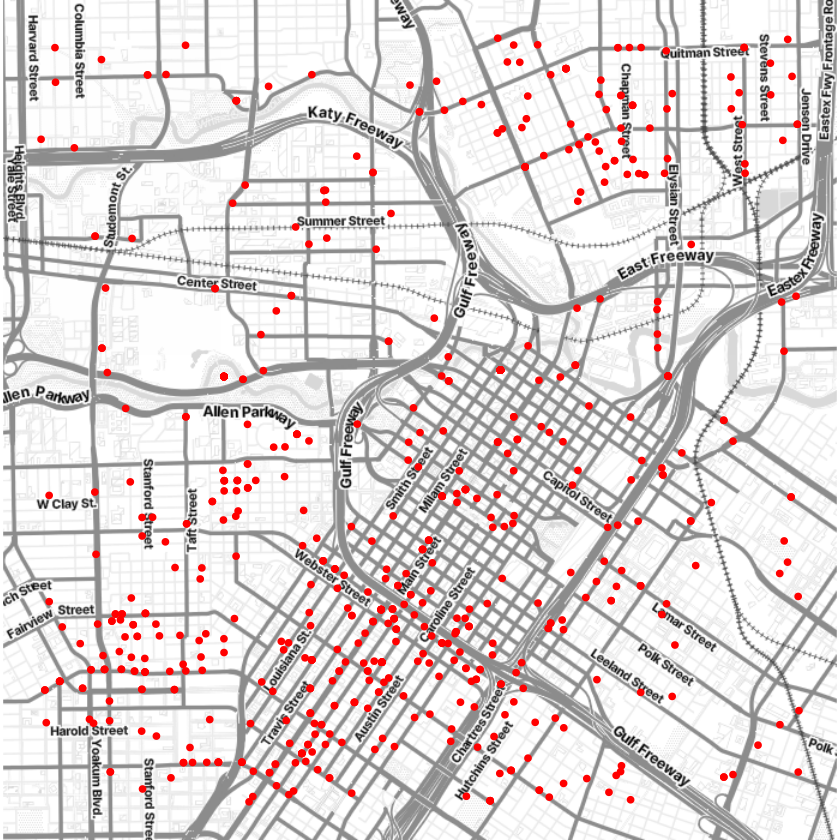

In [3]:
# Install and load required packages
install.packages("ggmap")
install.packages("dplyr")
install.packages("forcats")

library("ggmap")
library("dplyr")
library("forcats")

# Define helper function
`%notin%` <- function(lhs, rhs) !(lhs %in% rhs)

# Filter violent crimes in downtown Houston
violent_crimes <- crime %>%
  filter(
    offense %notin% c("auto theft", "theft", "burglary"),
    between(lon, -95.39681, -95.34188),
    between(lat, 29.73631, 29.78400)
  ) %>%
  mutate(
    offense = fct_drop(offense),
    offense = fct_relevel(offense, c("robbery", "aggravated assault", "rape", "murder"))
  )

# Make a scatterplot on a map with a valid map type
qmplot(lon, lat, data = violent_crimes, maptype = "stamen_toner_lite", color = I("red")) # This map type is supported by Stadia Maps. Replace any unsupported map type with this one to avoid errors

All the **ggplot2** geom’s are available. For example, you can make a contour plot with geom = `"density2d"`:

ℹ Using `zoom = 14`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



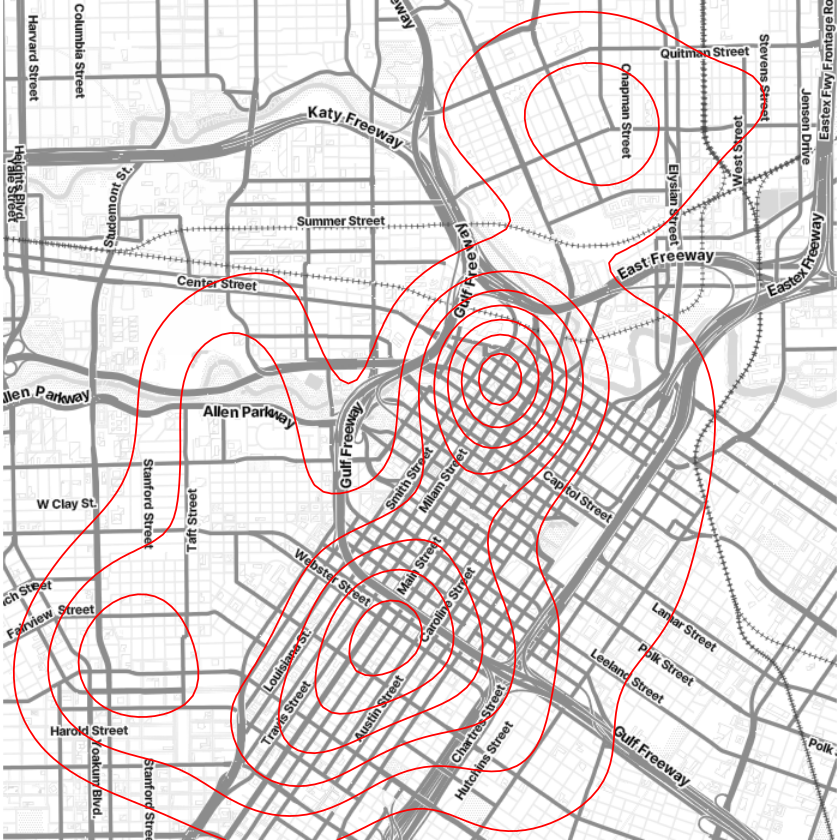

In [4]:
# Updated qmplot with a valid maptype and density2d layer
qmplot(lon, lat, data = violent_crimes, maptype = "stamen_toner_lite", geom = "density2d", color = I("red"))

In fact, since **ggmap’s** built on top of **ggplot2**, all your usual **ggplot2** stuff (geoms, polishing, etc.) will work, and there are some unique graphing perks **ggmap** brings to the table, too.

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



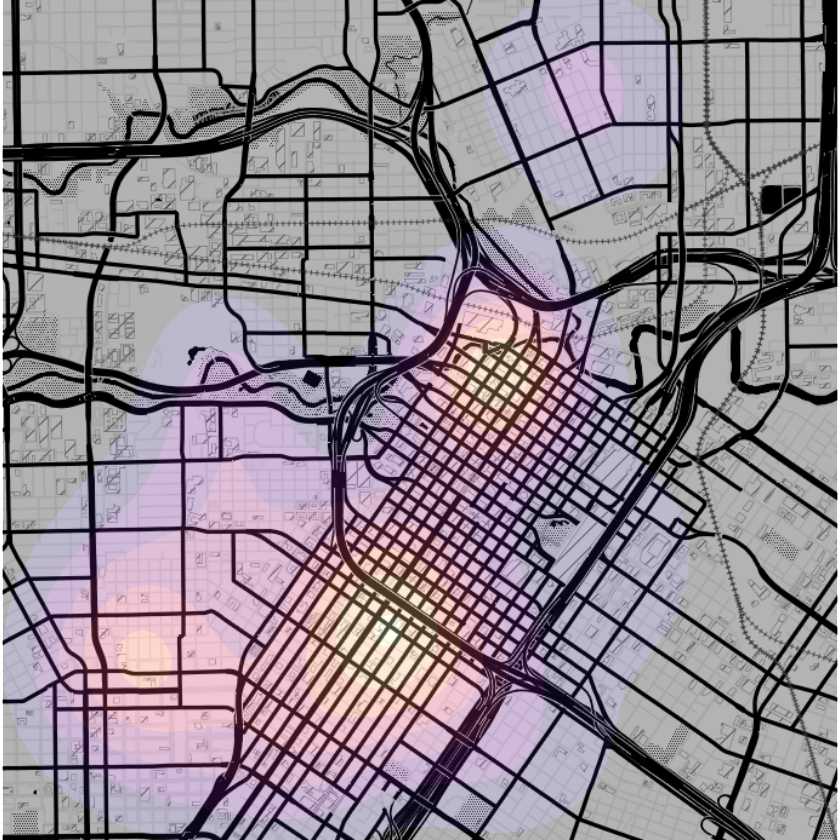

In [6]:
# Install and load required packages
install.packages("ggmap")
install.packages("ggdensity")
install.packages("viridis")

library(ggmap)
library(ggdensity)
library(viridis)

# Define the dataset for robberies
robberies <- violent_crimes %>% filter(offense == "robbery")

# Plot using qmplot with density contours
qmplot(lon, lat, data = robberies, geom = "blank",
  zoom = 14, maptype = "stamen_toner_background"
) +
  geom_density2d_filled(aes(lon, lat, fill = after_stat(level)), alpha = 0.3) + # This function provides filled contours that represent density levels
  scale_fill_viridis_d(option = "A") +
  theme(legend.position = "none")

Faceting works, too:

ℹ Using `zoom = 14`

ℹ © Stadia Maps © Stamen Design © OpenMapTiles © OpenStreetMap contributors.



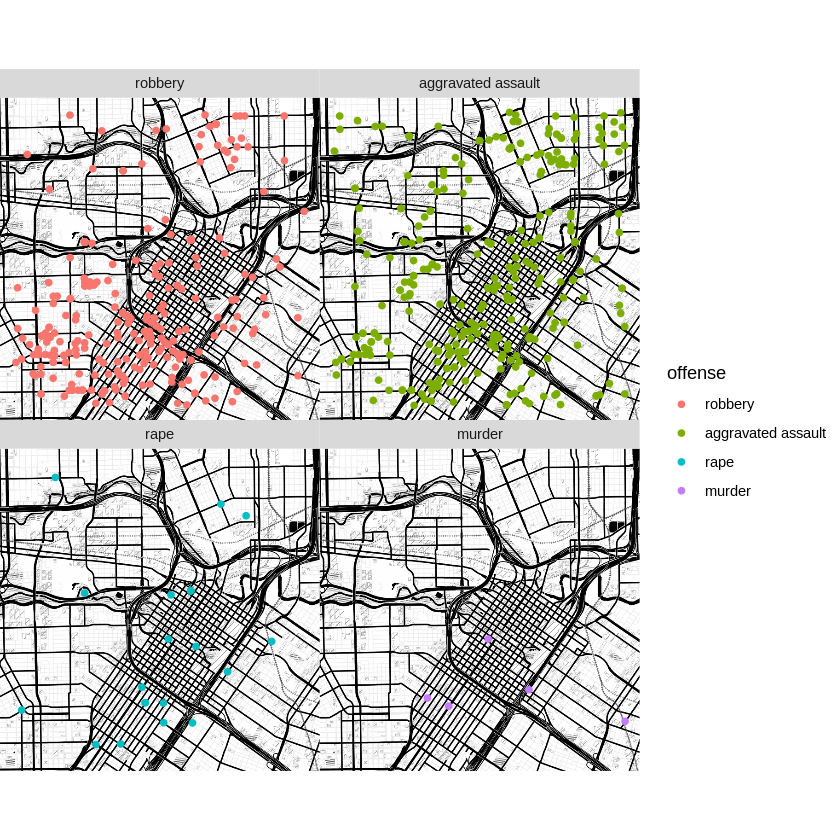

In [8]:
# Corrected maptype for Stadia Maps
qmplot(lon, lat, data = violent_crimes, maptype = "stamen_toner_background", color = offense) +
  facet_wrap(~ offense)

**Supported Map Types for Stadia Maps**

Valid options include:
- "stamen_terrain"
- "stamen_toner"
- "stamen_toner_lite"
- "stamen_watercolor"
-	"alidade_smooth"
-	"alidade_smooth_dark"
-	"outdoors"
-	"stamen_toner_background"

##1.1 Google Maps

[Google Maps](http://developers.google.com/maps/terms) can be used just as easily. However, since Google Maps use a center/zoom specification, their input is a bit different:

ℹ Creating file /root/.Renviron

ℹ Adding key to /root/.Renviron

ℹ <https://maps.googleapis.com/maps/api/staticmap?center=waco%20texas&zoom=12&size=640x640&scale=2&maptype=terrain&key=xxx-eU>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=waco+texas&key=xxx-eU>

1280x1280 terrain map image from Google Maps; use `ggmap::ggmap()` to plot it.



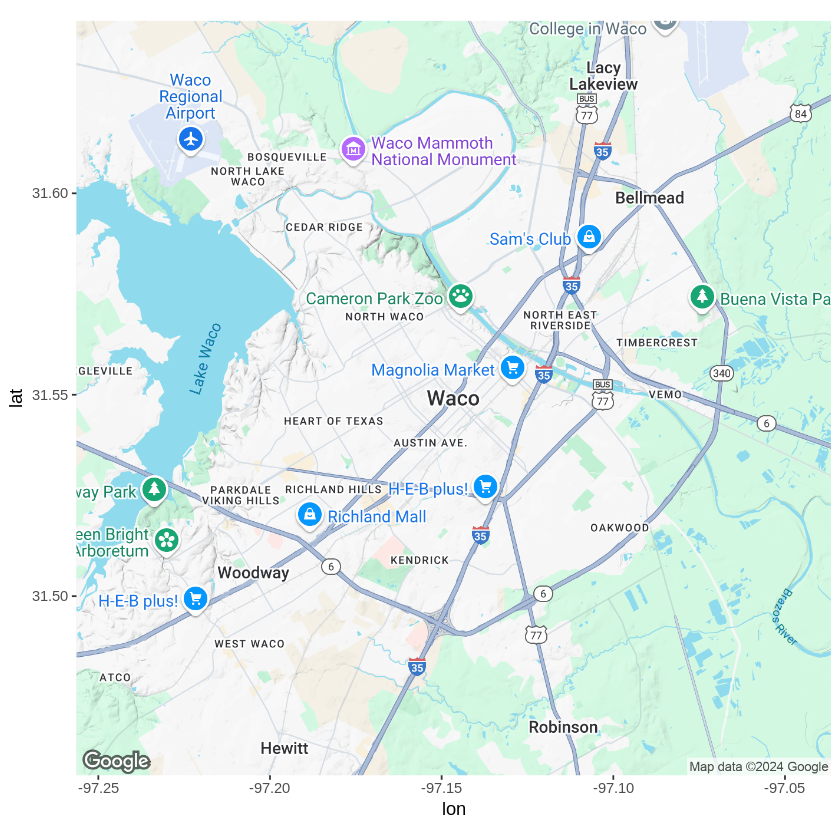

In [10]:
ggmap::register_google(key = 'Your API Key Here', write = TRUE)
(map <- get_googlemap("waco texas", zoom = 12))
ggmap(map)

Moreover, you can get various different styles of Google Maps with **ggmap** (just like Stamen Maps):

ℹ <https://maps.googleapis.com/maps/api/staticmap?center=waco%20texas&zoom=12&size=640x640&scale=2&maptype=satellite&key=xxx-eU>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=waco+texas&key=xxx-eU>

ℹ <https://maps.googleapis.com/maps/api/staticmap?center=waco%20texas&zoom=12&size=640x640&scale=2&maptype=hybrid&key=xxx-eU>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=waco+texas&key=xxx-eU>



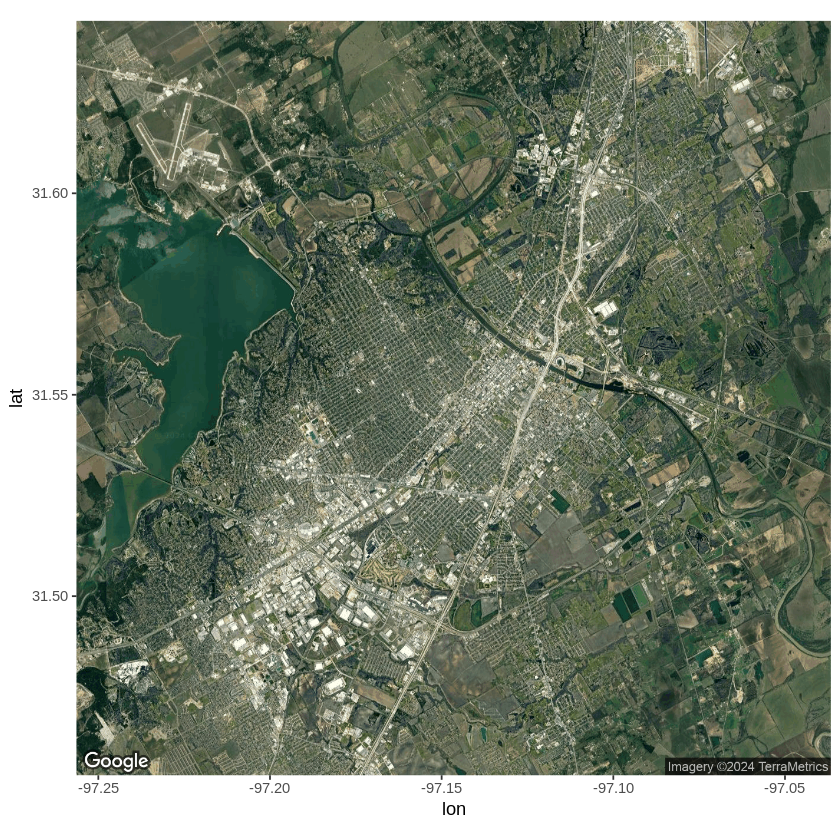

ℹ <https://maps.googleapis.com/maps/api/staticmap?center=waco%20texas&zoom=12&size=640x640&scale=2&maptype=roadmap&key=xxx-eU>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=waco+texas&key=xxx-eU>



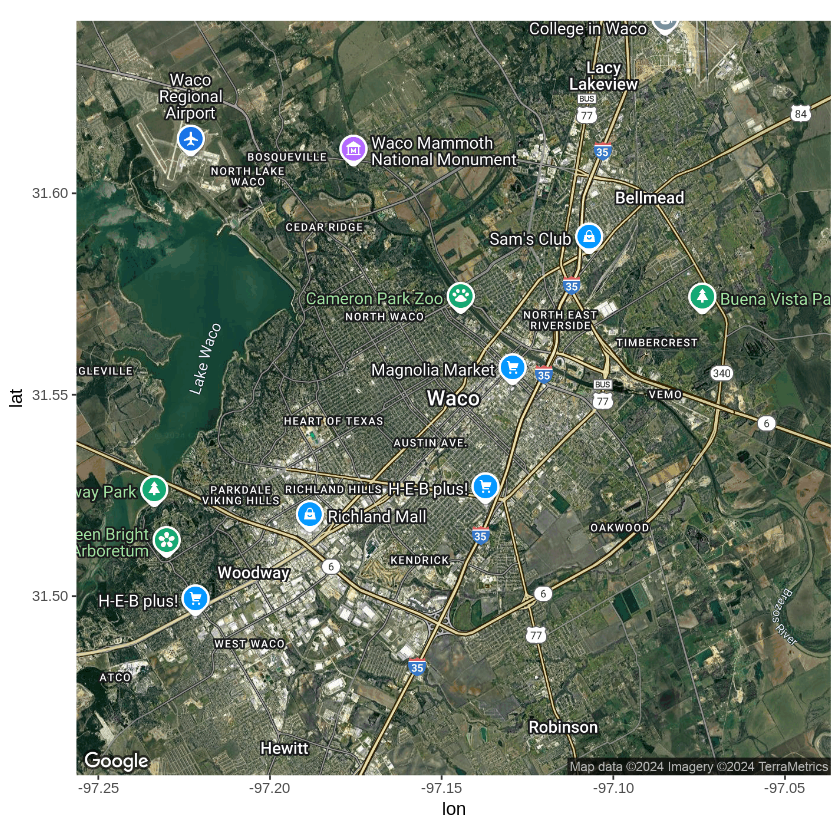

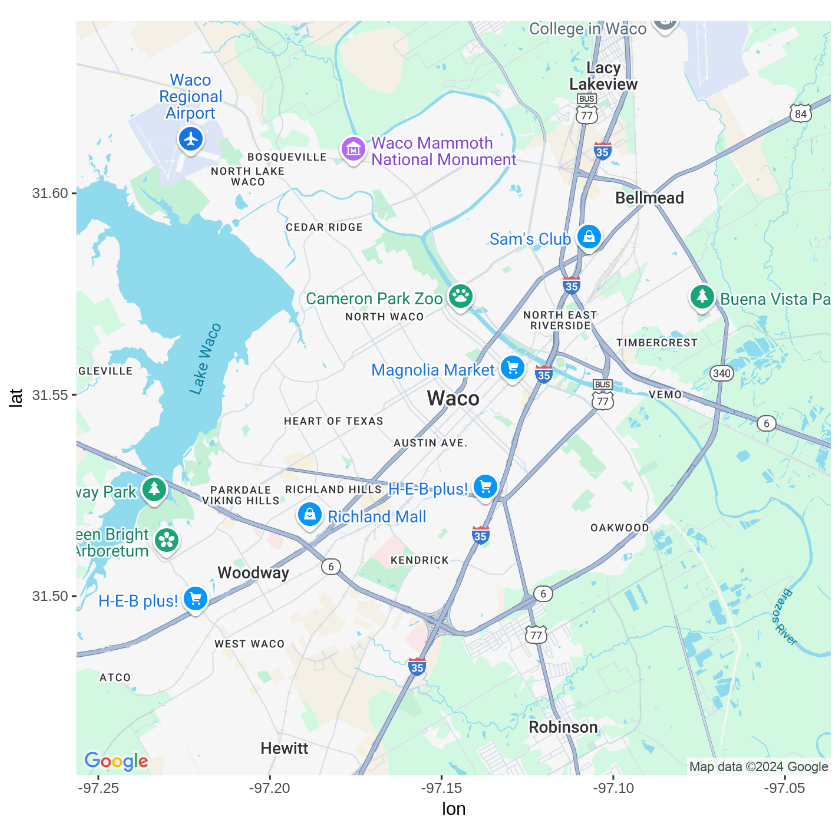

In [11]:
get_googlemap("waco texas", zoom = 12, maptype = "satellite") %>% ggmap()
get_googlemap("waco texas", zoom = 12, maptype = "hybrid") %>% ggmap()
get_googlemap("waco texas", zoom = 12, maptype = "roadmap") %>% ggmap()

Google’s geocoding and reverse geocoding API’s are available through `geocode()` and `revgeocode()`, respectively:

In [12]:
geocode("1301 S University Parks Dr, Waco, TX 76798")

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=1301+S+University+Parks+Dr,+Waco,+TX+76798&key=xxx-eU>



lon,lat
<dbl>,<dbl>
-97.11606,31.55101


In [13]:
revgeocode(c(lon = -97.1161, lat = 31.55098))

ℹ <https://maps.googleapis.com/maps/api/geocode/json?latlng=31.55098,-97.1161&key=xxx-eU>

Warning message:
“Multiple addresses found, the first will be returned:”
!   1301 S University Parks Dr, Waco, TX 76706, USA

!   55 Baylor Ave, Waco, TX 76706, USA

!   1437 S University Parks Dr, Waco, TX 76706, USA

!   HV2M+9H Waco, TX, USA

!   Bear Trail, Waco, TX 76706, USA

!   Robinson, TX 76706, USA

!   Waco, TX, USA

!   McLennan County, TX, USA

!   Texas, USA

!   United States



[1] "1301 S University Parks Dr, Waco, TX 76706, USA"

There is also a `mutate_geocode()` that works similarly to [dplyr’s](https://github.com/hadley/dplyr) `mutate()` function:

In [14]:
tibble(address = c("white house", "", "waco texas")) %>%
  mutate_geocode(address)

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=white+house&key=xxx-eU>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=waco+texas&key=xxx-eU>



address,lon,lat
<chr>,<dbl>,<dbl>
white house,-77.03653,38.89768
,NA,NA
waco texas,-97.14667,31.54933


Treks use Google’s routing API to give you routes (`route()` and `trek()` give slightly different results; the latter hugs roads):

ℹ <https://maps.googleapis.com/maps/api/directions/json?origin=houson,+texas&destination=waco,+texas&key=xxx-eU&mode=driving&alternatives=false&units=metric>

ℹ <https://maps.googleapis.com/maps/api/staticmap?center=college%20station,%20texas&zoom=8&size=640x640&scale=2&maptype=terrain&language=en-EN&key=xxx-eU>

ℹ <https://maps.googleapis.com/maps/api/geocode/json?address=college+station,+texas&key=xxx-eU>

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


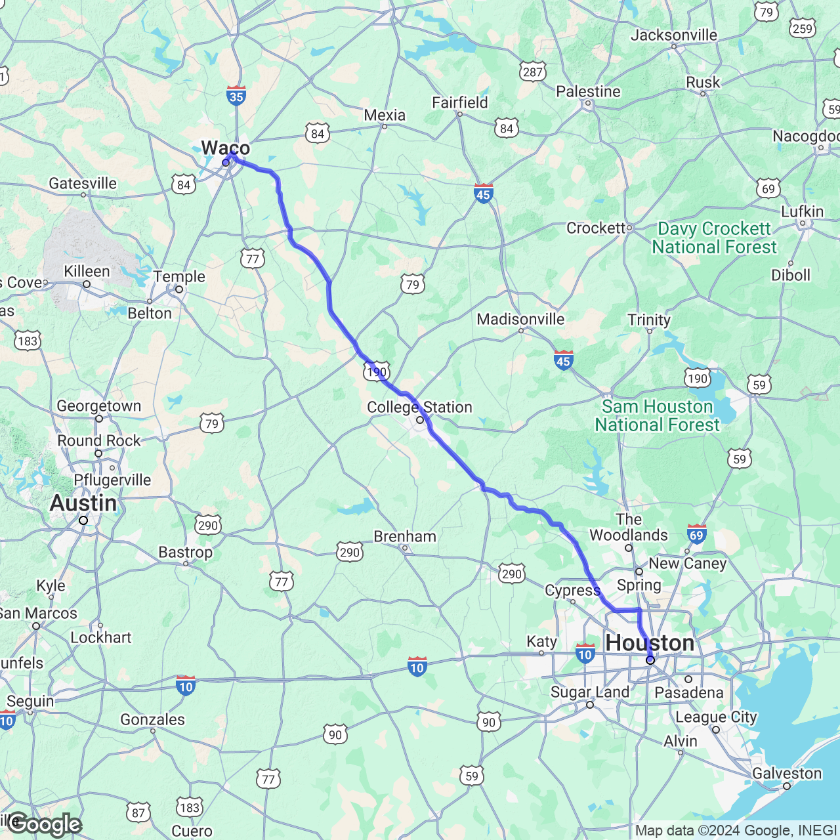

In [15]:
trek_df <- trek("houson, texas", "waco, texas", structure = "route")
qmap("college station, texas", zoom = 8) +
  geom_path(
    aes(x = lon, y = lat),  colour = "blue",
    size = 1.5, alpha = .5,
    data = trek_df, lineend = "round"
  )

(They also provide information on how long it takes to get from point A to point B.)

Map distances, in both length and anticipated time, can be computed with `mapdist()`. Moreover the function is vectorized:

In [16]:
mapdist(c("houston, texas", "dallas"), "waco, texas")

ℹ <https://maps.googleapis.com/maps/api/distancematrix/json?origins=dallas&destinations=waco,+texas&key=xxx-eU&mode=driving>

ℹ <https://maps.googleapis.com/maps/api/distancematrix/json?origins=houston,+texas&destinations=waco,+texas&key=xxx-eU&mode=driving>



from,to,m,km,miles,seconds,minutes,hours,mode
<chr>,<chr>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>
dallas,"waco, texas",152605,152.605,94.82875,5260,87.66667,1.461111,driving
"houston, texas","waco, texas",294943,294.943,183.27758,10488,174.80000,2.913333,driving


## 1.2 Google Maps API key

A few years ago Google has [changed its API requirements](https://developers.google.com/maps/documentation/geocoding/usage-and-billing), and **ggmap** users are now required to register with Google. From a user’s perspective, there are essentially three ramifications of this:

1. Users must register with Google. You can do this at [https://mapsplatform.google.com/](https://mapsplatform.google.com). While it will require a valid credit card (sorry!), there seems to be a fair bit of free use before you incur charges, and even then the charges are modest for light use.

2. Users must enable the APIs they intend to use. What may appear to **ggmap** users as one overarching “Google Maps” product, Google in fact has several services that it provides as geo-related solutions. For example, the [Maps Static API](https://developers.google.com/maps/documentation/maps-static/intro) provides map images, while the [Geocoding API](https://developers.google.com/maps/documentation/geocoding/intro) provides geocoding and reverse geocoding services. Apart from the relevant Terms of Service, generally **ggmap** users don’t need to think about the different services. For example, you just need to remember that `get_googlemap()` gets maps, `geocode()` geocodes (with Google, DSK is done), etc., and **ggmap** handles the queries for you. However, you do need to enable the APIs before you use them. You’ll only need to do that once, and then they’ll be ready for you to use. Enabling the APIs just means clicking a few radio buttons on the Google Maps Platform web interface listed above, so it’s easy.

3. Inside R, after loading the new version of **ggmap**, you’ll need provide **ggmap** with your API key, a [hash value](https://en.wikipedia.org/wiki/Hash_function) (think string of jibberish) that authenticates you to Google’s servers. This can be done on a temporary basis with `register_google(key = "[your key]")` or permanently using `register_google(key = "[your key]"`, write = TRUE) (note: this will overwrite your `~/.Renviron` file by replacing/adding the relevant line). If you use the former, know that you’ll need to re-do it every time you reset R.

Your API key is private and unique to you, so be careful not to share it online, for example in a GitHub issue or saving it in a shared R script file. If you share it inadvertantly, just get on Google’s website and regenerate your key - this will retire the old one. Keeping your key private is made a bit easier by **ggmap** scrubbing the key out of queries by default, so when URLs are shown in your console, they’ll look something like `key=xxx`. (Read the details section of the `register_google()` documentation for a bit more info on this point.)

The new version of **ggmap** is now on CRAN soon, but you can install the latest version, including an important bug fix in `mapdist()`, here with:

In [17]:
if(!requireNamespace("devtools")) install.packages("devtools")
devtools::install_github("dkahle/ggmap")

Loading required namespace: devtools




curl (5.2.3 -> 6.0.0) [CRAN]


Installing 1 packages: curl

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/RtmpFgtx0W/remotes12c7d2a6a16/dkahle-ggmap-8b12beb/DESCRIPTION’ ... OK
* preparing ‘ggmap’:
* checking DESCRIPTION meta-information ... OK
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
Removed empty directory ‘ggmap/.github’
* building ‘ggmap_4.0.0.900.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



## 1.3 Installation
From CRAN: `install.packages("ggmap")`

From Github:

In [18]:
if (!requireNamespace("remotes")) install.packages("remotes")
remotes::install_github("dkahle/ggmap")

Skipping install of 'ggmap' from a github remote, the SHA1 (8b12bebc) has not changed since last install.
  Use `force = TRUE` to force installation

